In [34]:
import cv2
import face_recognition
import pafy
from IPython.display import display
from loguru import logger
from PIL import Image, ImageDraw, ImageEnhance, ImageFont
from pyprojroot import here

In [2]:
def load_and_show_image(path):
    image = cv2.cvtColor(cv2.imread(str(path)), cv2.COLOR_BGR2RGB)
    display(Image.fromarray(image))
    return image

## Images with multiple faces

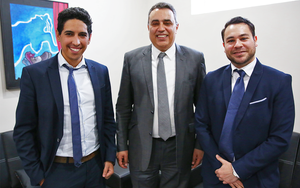

In [3]:
img_multiple_faces_path = here("data/raw/multiple.png")
img_multiple_faces = load_and_show_image(img_multiple_faces_path)

In [4]:
face_locations_multiple_faces = face_recognition.face_locations(img_multiple_faces)
face_locations_multiple_faces

[(26, 253, 62, 217), (22, 93, 58, 57), (14, 177, 50, 141)]

In [64]:
len(face_recognition.face_encodings(img_multiple_faces, face_locations_multiple_faces))

3

## Imags with a single face

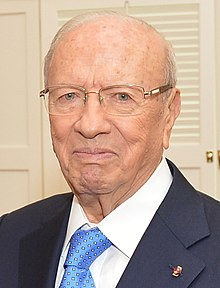

In [5]:
img_single_face_path = here("data/raw/bce.jpg")
img_single_face = load_and_show_image(img_single_face_path)

In [6]:
face_locations_single_face = face_recognition.face_locations(img_single_face)
face_locations_single_face

[(53, 153, 182, 24)]

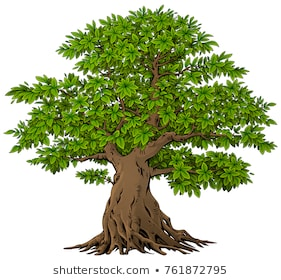

In [7]:
img_no_faces_path = here("data/raw/no_faces.jpg")
img_no_faces = load_and_show_image(img_no_faces_path)

In [8]:
face_locations_no_faces = face_recognition.face_locations(img_no_faces)
face_locations_no_faces

[]

In [65]:
face_recognition.face_encodings(img_no_faces, face_locations_no_faces)

[]

## Drawing bounding rectangles

In [30]:
def draw_locations(image_array, locations):
    image = Image.fromarray(image_array)
    for location in locations:
        draw = ImageDraw.Draw(image)
        t, r, b, l = location
        draw.rectangle([r, t, l, b], outline="red")
    return image

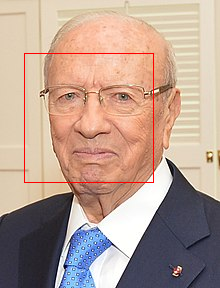

In [31]:
draw_locations(img_single_face, face_locations_single_face)

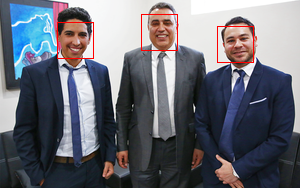

In [41]:
draw_locations(img_multiple_faces, face_locations_multiple_faces)

## JupyterLab as a Frontend

In [43]:
video_stream_url = pafy.new("https://www.youtube.com/watch?v=l9MUa1sWl4Y").getbest().url

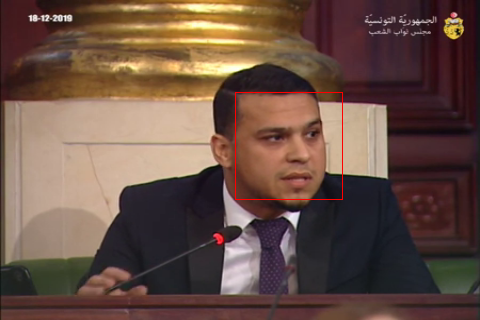

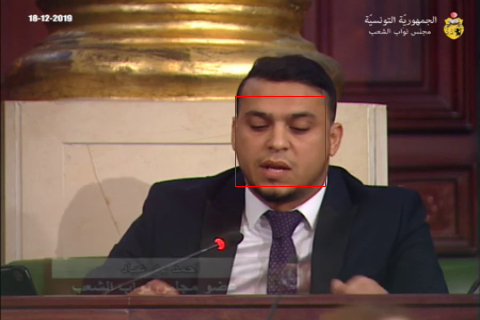

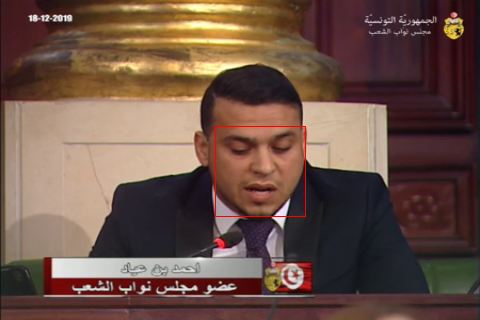

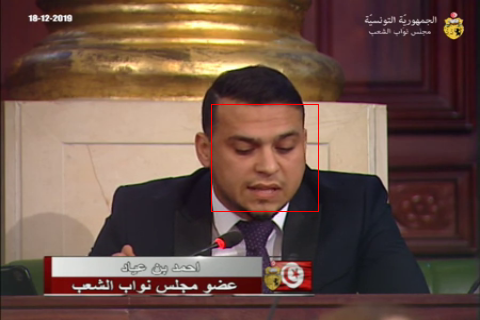

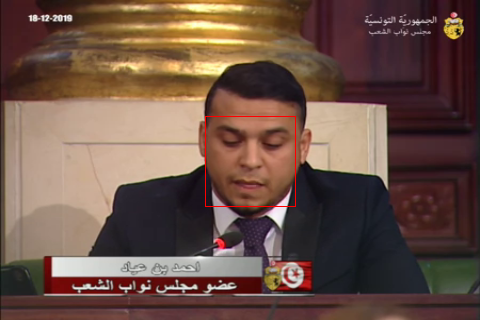

...

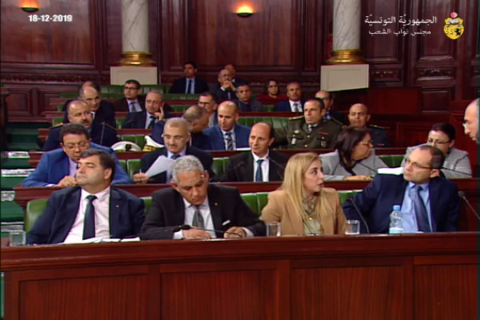

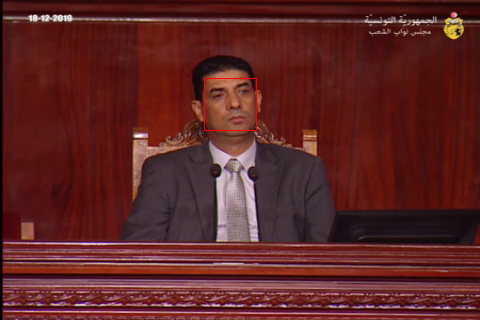

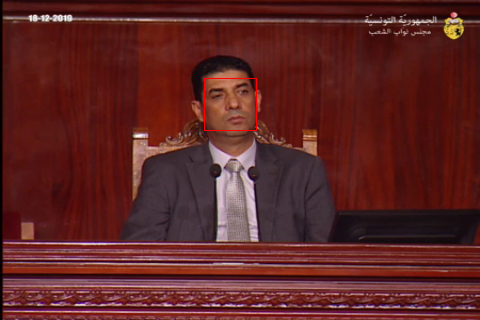

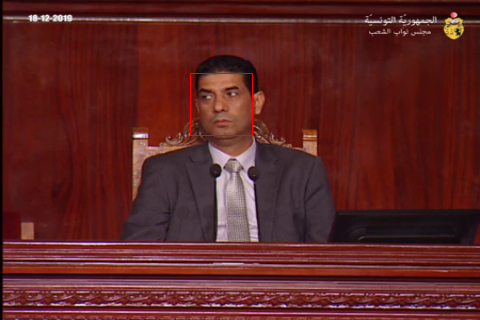

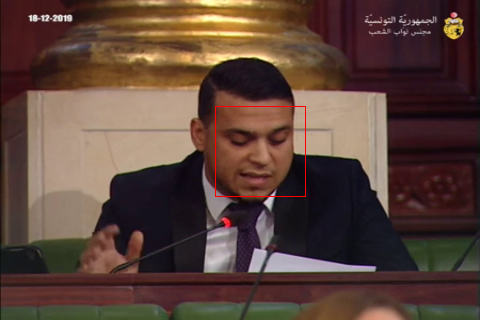

In [61]:
capture = cv2.VideoCapture(video_stream_url)
max_frames = 3000
current_frame = 0
frame_skip = 60
while current_frame < max_frames:
    current_frame += 1
    ret, frame = capture.read()
    if not ret:
        logger.error("Ret failed, exiting")
    if current_frame % frame_skip != 0:
        continue
    else:
        rgb_frame = cv2.cvtColor(frame, code=cv2.COLOR_BGR2RGB)
        resized_frame = cv2.resize(rgb_frame, dsize=(480, 320))
        face_locations = face_recognition.face_locations(resized_frame)
        bordered_frame = draw_locations(resized_frame, face_locations)
        display(bordered_frame)